In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


import glob

sns.set_style('darkgrid')

## Data Import

In [2]:
%%time

path = r"/Users/admin/Jupyter/Roma_Proj/rta/data"
filenames = glob.glob(path + "/*.csv")

li = []
for f in filenames:
    df = pd.read_csv(f, encoding='latin', header=0, sep=';', parse_dates=True)
    li.append(df)

frame = pd.concat(li, ignore_index=True)

frame['DataOraIncidente'] = pd.to_datetime(frame['DataOraIncidente'])
geo_cols = ['Latitude', 'Longitude', 'Latitudine', 'Longitudine']

frame['Longitudine'] = (frame['Longitudine'].str.replace(',','.',regex=True)).astype(float)

frame['Latitude'] = (frame['Latitude'].str.replace(',','.', regex=True)).astype(float)
frame['Longitude'] = (frame['Longitude'].str.replace(',','.',regex=True)).astype(float)
frame['Latitudine'] = (frame['Latitudine'].str.replace(',','.',regex=True)).astype(float)

<timed exec>:11: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.


CPU times: user 8.53 s, sys: 315 ms, total: 8.85 s
Wall time: 8.92 s


In [3]:
frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 349308 entries, 0 to 349307
Data columns (total 40 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Protocollo              349308 non-null  int64         
 1   Gruppo                  349308 non-null  int64         
 2   DataOraIncidente        349308 non-null  datetime64[ns]
 3   Localizzazione1         343657 non-null  object        
 4   STRADA1                 349308 non-null  object        
 5   Localizzazione2         349308 non-null  object        
 6   STRADA2                 127126 non-null  object        
 7   Strada02                268159 non-null  object        
 8   Chilometrica            141033 non-null  object        
 9   DaSpecificare           81149 non-null   object        
 10  NaturaIncidente         349237 non-null  object        
 11  particolaritastrade     343515 non-null  object        
 12  TipoStrada              343552

## Reshape wide to long on casualties and join on Protocollo

In [4]:
%%time

feriti = (frame
 .pivot_table(index='Protocollo', columns='TipoPersona', values=['NUM_FERITI','NUM_MORTI'])
 .fillna(0)
 .reset_index()
 )
         

feriti.columns = ['_'.join(col).strip() for col in feriti.columns.values]



cols = ['Protocollo', 'Gruppo', 'DataOraIncidente', 'Localizzazione1','Longitude','Latitude',
        'Longitudine','Latitudine','STRADA1', 'Localizzazione2', 'STRADA2', 'Strada02', 'Chilometrica',
       'DaSpecificare', 'NaturaIncidente', 'particolaritastrade', 'TipoStrada',
       'FondoStradale','TipoVeicolo', 'Pavimentazione', 'Segnaletica',
       'CondizioneAtmosferica', 'Traffico', 'Visibilita', 'Illuminazione']

rta = (frame[cols]
 .merge(feriti, left_on='Protocollo', right_on='Protocollo_', how='right')
 .set_index('DataOraIncidente')
 .sort_index()
 .assign(tot_feriti = lambda x:(x['NUM_FERITI_Conducente'] + x['NUM_FERITI_Passeggero'] + x['NUM_FERITI_Pedone'] + x['NUM_FERITI_Passeggero Istruttore'] + x['NUM_FERITI_Pedone sconosciuto']),
         tot_morti = lambda x:(x['NUM_MORTI_Conducente'] + x['NUM_MORTI_Passeggero'] + x['NUM_MORTI_Pedone'] + x['NUM_MORTI_Passeggero Istruttore'] + x['NUM_MORTI_Pedone sconosciuto']),
         giorno = lambda x:x.index.day_of_week,
         mese = lambda x:x.index.month,
         ora = lambda x:x.index.hour,
         Latitude = lambda x: (x['Latitude'].fillna(x['Latitudine'])),
         Longitude = lambda x: (x['Longitude'].fillna(x['Longitudine']))
        )
 .drop(columns=['NUM_FERITI_Passeggero Istruttore','NUM_FERITI_Pedone sconosciuto',
                'NUM_MORTI_Passeggero Istruttore','NUM_MORTI_Pedone sconosciuto',
               'NUM_FERITI_Pedone non identificato','NUM_MORTI_Pedone non identificato'])

            

 
).drop_duplicates(subset='Protocollo')

CPU times: user 985 ms, sys: 277 ms, total: 1.26 s
Wall time: 1.29 s


In [5]:
rta.head()


,Protocollo,Gruppo,Localizzazione1,Longitude,Latitude,Longitudine,Latitudine,STRADA1,Localizzazione2,STRADA2,...,NUM_FERITI_Passeggero,NUM_FERITI_Pedone,NUM_MORTI_Conducente,NUM_MORTI_Passeggero,NUM_MORTI_Pedone,tot_feriti,tot_morti,giorno,mese,ora
DataOraIncidente,,,,,,,,,,,,,,,,,,,,,
2017-01-01 00:05:00,3119648,1,Strada Urbana,NaN,NaN,NaN,NaN,PIAZZA DI PORTA MAGGIORE,da specificare,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,1,0
2017-01-01 00:10:00,3117983,9,Strada Urbana,NaN,NaN,NaN,NaN,VIA NUMANZIA,all'intersezione semaforizzata con,VIA LATINA,...,2.0,0.0,0.0,0.0,0.0,4.0,0.0,6,1,0
2017-01-01 01:00:00,3118773,10,Strada Urbana,NaN,NaN,NaN,NaN,VIALE DEI SALESIANI,all'intersezione semaforizzata con,VIA PUBLIO VALERIO,...,4.0,0.0,0.0,0.0,0.0,8.0,0.0,6,1,1
2017-01-01 01:00:00,3118127,1,Strada Urbana,NaN,NaN,NaN,NaN,VIA PARIGI,all'intersezione con,VIA GIUSEPPE ROMITA,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,1,1
2017-01-01 01:30:00,3117976,8,Strada Urbana,NaN,NaN,NaN,NaN,VIA DI ROCCA CENCIA,in prossimità,NaN,...,1.0,0.0,0.0,0.0,0.0,2.0,0.0,6,1,1


In [6]:
rta['Chilometrica'].unique()

array([nan, '147', '417', ..., '5650', '163c', '593/B'], dtype=object)

''

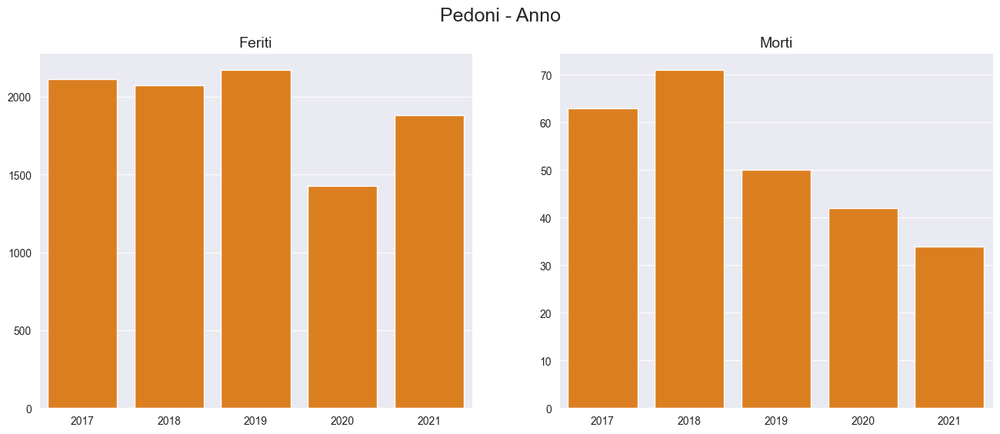

In [7]:
feriti_pedone = (rta.groupby(rta.index.year)['NUM_FERITI_Pedone'].sum()).to_frame()
morti_pedone = (rta.groupby(rta.index.year)['NUM_MORTI_Pedone'].sum()).to_frame()


fig, axes = plt.subplots(1, 2, sharex=False, figsize=(16,6))
fig.suptitle('Pedoni - Anno', fontsize=18)

sns.barplot(ax=axes[0],
            data=feriti_pedone,
            x=feriti_pedone.index,
            y='NUM_FERITI_Pedone',
            color='#FA7E01'
         )

sns.barplot(ax=axes[1],
            data=morti_pedone,
            x=morti_pedone.index,
            y='NUM_MORTI_Pedone',
            color='#FA7E01',
        
         )

axes[0].set_title('Feriti', fontsize=14)
axes[0].set(ylabel='', xlabel='')
axes[1].set_title('Morti', fontsize=14)
axes[1].set(ylabel='', xlabel='')


;

''

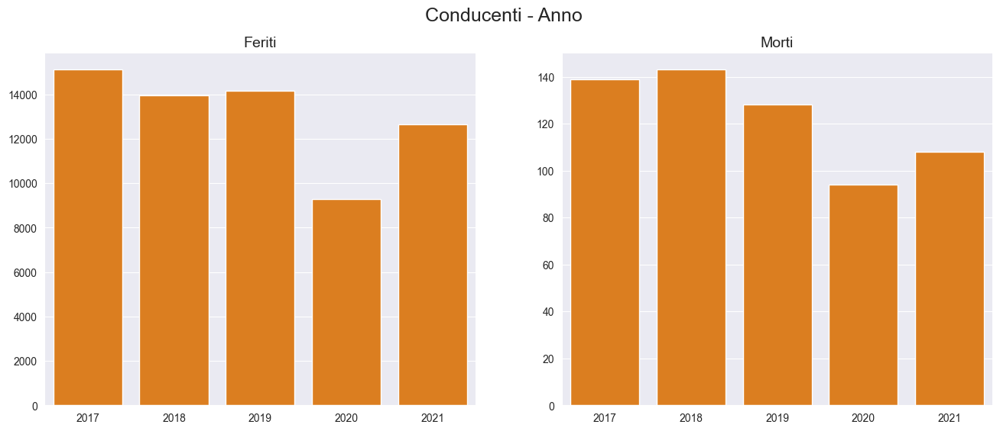

In [8]:
feriti_conducente = (rta.groupby(rta.index.year)['NUM_FERITI_Conducente'].sum()).to_frame()
morti_conducente = (rta.groupby(rta.index.year)['NUM_MORTI_Conducente'].sum()).to_frame()


fig, axes = plt.subplots(1, 2, sharex=False, figsize=(16,6))
fig.suptitle('Conducenti - Anno', fontsize=18)

sns.barplot(ax=axes[0],
            data=feriti_conducente,
            x=feriti_conducente.index,
            y='NUM_FERITI_Conducente',
            color='#FA7E01'
         )

sns.barplot(ax=axes[1],
            data=morti_conducente,
            x=morti_conducente.index,
            y='NUM_MORTI_Conducente',
            color='#FA7E01',
        
         )

axes[0].set_title('Feriti', fontsize=14)
axes[0].set(ylabel='', xlabel='')
axes[1].set_title('Morti', fontsize=14)
axes[1].set(ylabel='', xlabel='')


;

''

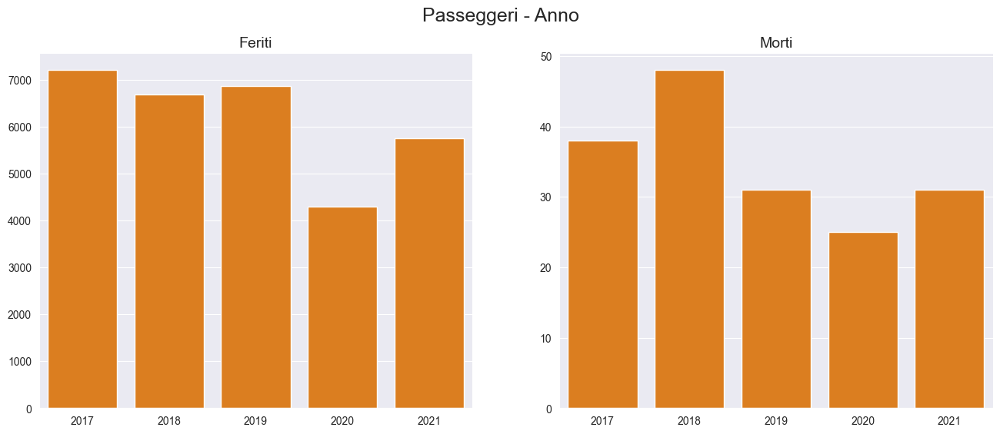

In [9]:
feriti_passeggero = (rta.groupby(rta.index.year)['NUM_FERITI_Passeggero'].sum()).to_frame()
morti_passeggero = (rta.groupby(rta.index.year)['NUM_MORTI_Passeggero'].sum()).to_frame()


fig, axes = plt.subplots(1, 2, sharex=False, figsize=(16,6))
fig.suptitle('Passeggeri - Anno', fontsize=18)

sns.barplot(ax=axes[0],
            data=feriti_passeggero,
            x=feriti_passeggero.index,
            y='NUM_FERITI_Passeggero',
            color='#FA7E01'
         )

sns.barplot(ax=axes[1],
            data=morti_passeggero,
            x=morti_passeggero.index,
            y='NUM_MORTI_Passeggero',
            color='#FA7E01',
        
         )

axes[0].set_title('Feriti', fontsize=14)
axes[0].set(ylabel='', xlabel='')
axes[1].set_title('Morti', fontsize=14)
axes[1].set(ylabel='', xlabel='')


;

<AxesSubplot: xlabel='DataOraIncidente'>

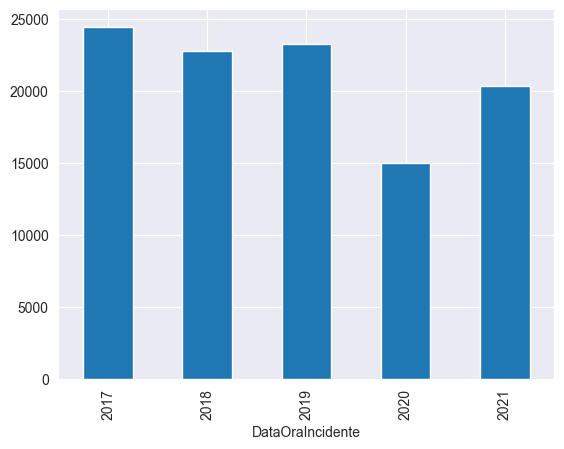

In [10]:
rta.groupby(rta.index.year)['tot_feriti'].sum().plot(kind='bar')

## Heatmaps

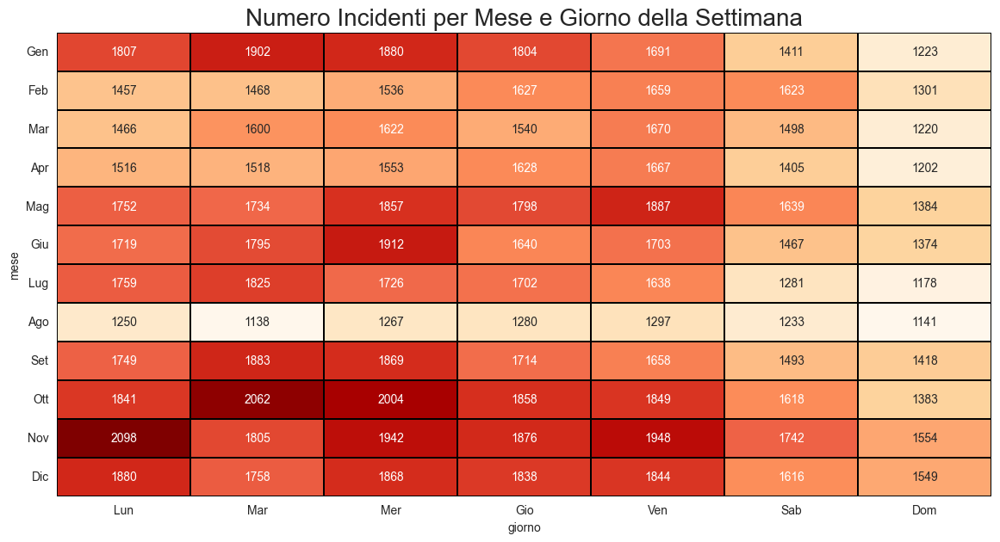

In [14]:
mesi = ['Gen','Feb','Mar','Apr','Mag','Giu','Lug','Ago','Set','Ott','Nov','Dic']
xticks_labels = ['Lun','Mar','Mer','Gio','Ven','Sab','Dom']


plt.figure(figsize=(14,7))
sns.heatmap((rta.groupby(['mese','giorno'])['Protocollo'].count().unstack()),
            annot=True,
            linewidths=0.3,
            linecolor='black',
            fmt='g',
            cmap='OrRd',
            cbar=False).set_title('Numero Incidenti per Mese e Giorno della Settimana', fontsize=20)
plt.yticks(np.arange(12) + .5,labels=mesi)
plt.yticks(rotation=0)
plt.xticks(np.arange(7) + .5,labels=xticks_labels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = True, bottom=False, top = False, labeltop=False)

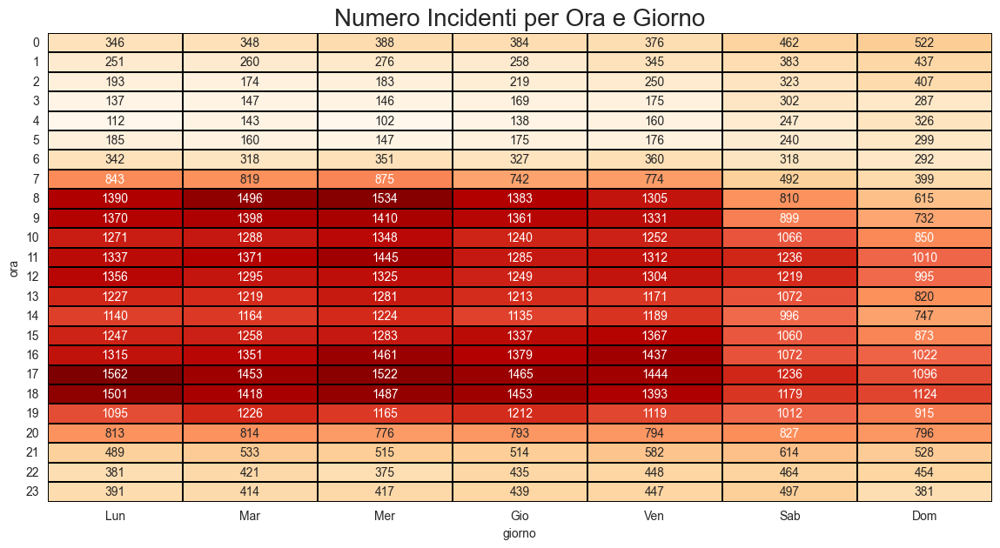

In [15]:
plt.figure(figsize=(14,7))
sns.heatmap((rta.groupby(['ora','giorno'])['Protocollo'].count().unstack()),
            annot=True,
            linewidths=0.3,
            linecolor='black',
            fmt='g',
            cmap='OrRd',
            cbar=False).set_title('Numero Incidenti per Ora e Giorno', fontsize=20)
# plt.yticks(np.arange(12) + .5,labels=mesi)
plt.yticks(rotation=0)
plt.xticks(np.arange(7) + .5,labels=xticks_labels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = True, bottom=False, top = False, labeltop=False)

## Incroci

<AxesSubplot: xlabel='incrocio'>

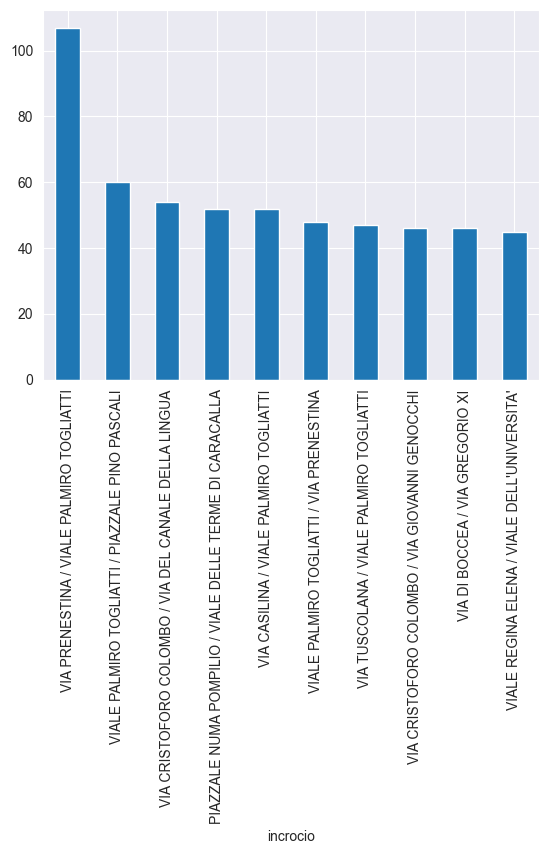

In [16]:
(rta
 .query("Localizzazione2.str.contains('intersezione')", engine='python')
 .assign(incrocio = lambda x:(x['STRADA1']+' / '+x['STRADA2']))
 .groupby('incrocio')['Protocollo']
 .count()
 .sort_values(ascending=False)
).head(10).plot(kind='bar')

<AxesSubplot:xlabel='incrocio'>

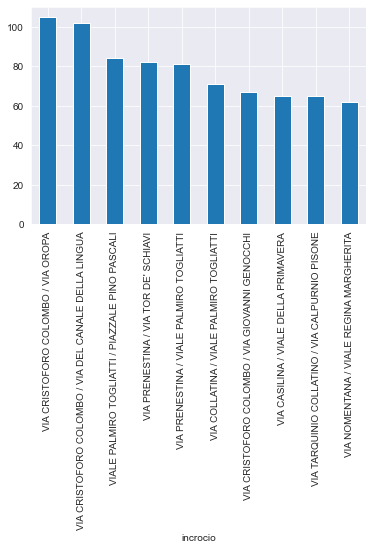

In [27]:
(rta
 .query("Localizzazione2.str.contains('intersezione')", engine='python')
 .assign(incrocio = lambda x:(x['STRADA1']+' / '+x['STRADA2']))
 .groupby('incrocio')['tot_feriti']
 .sum()
 .sort_values(ascending=False)
).head(10).plot(kind='bar')

<AxesSubplot:xlabel='incrocio'>

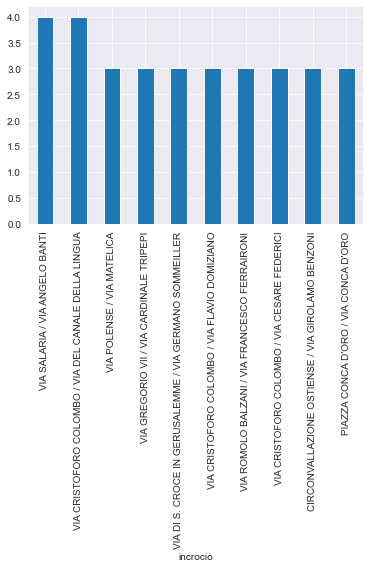

In [28]:
(rta
 .query("Localizzazione2.str.contains('intersezione')", engine='python')
 .assign(incrocio = lambda x:(x['STRADA1']+' / '+x['STRADA2']))
 .groupby('incrocio')['tot_morti']
 .sum()
 .sort_values(ascending=False)
).head(10).plot(kind='bar')

## Maps

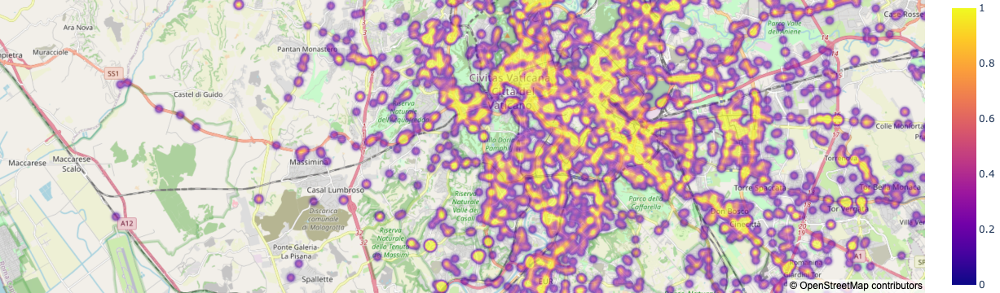

In [89]:
fig = px.density_mapbox(rta,
                        lat='Latitude',
                        lon='Longitude',
                        hover_data=['tot_feriti', 'tot_morti'],
                       zoom=10,
                       radius=8,
                       opacity=0.6
                       
                   )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})



In [23]:
rta.loc[rta['Longitude'].notna()].index

DatetimeIndex(['2018-01-06 00:01:00', '2018-01-06 00:05:00',
               '2018-01-06 00:10:00', '2018-01-06 00:15:00',
               '2018-01-06 00:50:00', '2018-01-06 02:00:00',
               '2018-01-06 03:00:00', '2018-01-06 03:30:00',
               '2018-01-06 03:45:00', '2018-01-06 04:14:00',
               ...
               '2019-12-06 20:05:00', '2019-12-06 20:10:00',
               '2019-12-06 20:15:00', '2019-12-06 20:45:00',
               '2019-12-06 21:25:00', '2019-12-06 23:10:00',
               '2019-12-06 23:15:00', '2019-12-06 23:15:00',
               '2019-12-06 23:30:00', '2019-12-06 23:30:00'],
              dtype='datetime64[ns]', name='DataOraIncidente', length=4862, freq=None)

In [44]:
(rta
 .groupby('STRADA1')[['Protocollo','NUM_FERITI_Conducente']]
 .agg({'Protocollo':'count', 'NUM_FERITI_Conducente':'sum'})
 .assign(feriti_per_incidente = lambda x:(x['NUM_FERITI_Conducente']/x['Protocollo']))
).sort_values(by=['Protocollo','feriti_per_incidente'], ascending=False)

,Protocollo,NUM_FERITI_Conducente,feriti_per_incidente
STRADA1,,,
VIA CASILINA,2600,1598.0,0.614615
VIA CRISTOFORO COLOMBO,2194,1410.0,0.642662
VIA PRENESTINA,2159,1275.0,0.590551
VIA TIBURTINA,2046,935.0,0.456989
VIA TUSCOLANA,1944,1017.0,0.523148
...,...,...,...
VICOLO DI VALLERANELLO,1,0.0,0.000000
VICOLO SAVINI,1,0.0,0.000000
VICOLO SCANDERBEG,1,0.0,0.000000


In [45]:
(rta
 .groupby('STRADA1')[['Protocollo','NUM_FERITI_Pedone']]
 .agg({'Protocollo':'count', 'NUM_FERITI_Pedone':'sum'})
 .assign(feriti_per_incidente = lambda x:(x['NUM_FERITI_Pedone']/x['Protocollo']))
).sort_values(by=['Protocollo','feriti_per_incidente'], ascending=False)

,Protocollo,NUM_FERITI_Pedone,feriti_per_incidente
STRADA1,,,
VIA CASILINA,2600,167.0,0.064231
VIA CRISTOFORO COLOMBO,2194,48.0,0.021878
VIA PRENESTINA,2159,97.0,0.044928
VIA TIBURTINA,2046,122.0,0.059629
VIA TUSCOLANA,1944,129.0,0.066358
...,...,...,...
VICOLO SAVINI,1,0.0,0.000000
VICOLO SCANDERBEG,1,0.0,0.000000
VICOLO SCAVOLINO,1,0.0,0.000000


In [49]:
(rta
 .groupby('TipoVeicolo')[['Protocollo','NUM_FERITI_Conducente']]
 .agg({'Protocollo':'count', 'NUM_FERITI_Conducente':'sum'})
 .assign(feriti_per_incidente = lambda x:(x['NUM_FERITI_Conducente']/x['Protocollo']))
)

,Protocollo,NUM_FERITI_Conducente,feriti_per_incidente
TipoVeicolo,,,
Altro,185,70.0,0.378378
Autoambulanza,126,114.0,0.904762
Autoambulanza in servizio,17,15.0,0.882353
Autoarticolato,330,43.0,0.130303
Autobus di linea,1152,502.0,0.435764
Autobus in extraurbana,49,15.0,0.306122
Autobus turistico,329,86.0,0.261398
Autobus urbano,573,226.0,0.394415
Autocaravan,69,21.0,0.304348


In [15]:
(rta
 .groupby('TipoVeicolo')[['Protocollo','NUM_MORTI_Conducente']]
 .agg({'Protocollo':'count', 'NUM_MORTI_Conducente':'sum'})
 .assign(feriti_per_incidente = lambda x:(x['NUM_MORTI_Conducente']/x['Protocollo']))
)

,Protocollo,NUM_MORTI_Conducente,feriti_per_incidente
TipoVeicolo,,,
Altro,185,0.0,0.000000
Autoambulanza,126,2.0,0.015873
Autoambulanza in servizio,17,0.0,0.000000
Autoarticolato,330,4.0,0.012121
Autobus di linea,1152,1.0,0.000868
Autobus in extraurbana,49,2.0,0.040816
Autobus turistico,329,4.0,0.012158
Autobus urbano,573,2.0,0.003490
Autocaravan,69,1.0,0.014493


In [62]:
(rta
 .query("tot_feriti > 0")
 .groupby('STRADA1')[['Protocollo', 'tot_feriti']]
 .agg({'Protocollo':'count', 'tot_feriti':'sum'})
 .sort_values(by='Protocollo',ascending=False)
)

,Protocollo,tot_feriti
STRADA1,,
VIA CASILINA,1184,2664.0
VIA CRISTOFORO COLOMBO,1005,2245.0
VIA PRENESTINA,877,2071.0
VIA NOMENTANA,783,1561.0
VIA TUSCOLANA,783,1675.0
...,...,...
VIA MATILDE DI CANOSSA,1,1.0
VIA DEI VALDERETTI,1,2.0
VIA MASTRO GABRIELLO,1,1.0


In [39]:
rta.groupby('STRADA1')['tot_morti'].sum().sort_values(ascending=False)

STRADA1
VIA CASILINA              36.0
VIA TIBURTINA             33.0
VIA NOMENTANA             28.0
VIA OSTIENSE              25.0
VIA CRISTOFORO COLOMBO    23.0
                          ... 
VIA DEI BERSAGLIERI        0.0
VIA DEI BERIO              0.0
VIA DEI BERGAMASCHI        0.0
VIA DEI BAULLARI           0.0
via g. zirardini           0.0
Name: tot_morti, Length: 8115, dtype: float64

In [72]:
rta.loc[(rta['STRADA1'] == 'VIA PRENESTINA') & (rta['tot_feriti'] > 30)][['NUM_FERITI_Conducente']]

,NUM_FERITI_Conducente
DataOraIncidente,
2017-09-19 10:35:00,17.0
